In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random
from PIL import Image
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator, img_to_array
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import TargetEncoder
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from collections import Counter
from sklearn.cluster import KMeans
from tensorflow.keras.applications import MobileNetV2, ResNet50


In [2]:
def getPredictionsTrain(model, dataset):
    y_pred = []  # store predicted labels
    y_true = []  # store true labels
    
    # Reset generator to start from the beginning
    dataset.reset()
  
    # Iterate over the dataset
    for _ in range(dataset.num_batches):
        image_batch, label_batch = next(dataset)
        # append true labels
        y_true.append(label_batch)
        # compute predictions
        preds = model.predict(image_batch, verbose=0)
        # append predicted labels
        y_pred.append(np.argmax(preds, axis=-1))

    # convert the true and predicted labels into tensors
    y_true = tf.concat([tf.convert_to_tensor(item) for item in y_true], axis=0)
    y_pred_classes = tf.concat([tf.convert_to_tensor(item) for item in y_pred], axis=0)
    class_labels = list(dataset.class_indices.keys())

    return y_true, y_pred_classes, class_labels

In [3]:
train_datagen = ImageDataGenerator(rescale=1./255)

val_datagen = ImageDataGenerator(rescale=1./255)

test_datagen = ImageDataGenerator(rescale=1./255)

In [4]:
batch_size = 64 
img_size = (224, 224)
def countImagesInClasses(dataset):
    class_counts = Counter()
    for _ in range(dataset.num_batches):
        _, labels = next(dataset)
        class_indices = np.argmax(labels, axis=1)
        class_counts.update(class_indices)
    return class_counts

print("Train_ds:")
train_ds = train_datagen.flow_from_directory(
    directory='bird_dataset/train',
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    target_size=img_size,
    shuffle=True)

class_names = {v: k for k, v in train_ds.class_indices.items()}

for index, count in countImagesInClasses(train_ds).items():
    print(f"  Trieda '{class_names[index]}': {count} obrázkov")
print("===================================")

print("Validation_ds:")
validation_ds = val_datagen.flow_from_directory(
    directory='bird_dataset/validation',
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    target_size=img_size,
    shuffle=False)

class_names = {v: k for k, v in validation_ds.class_indices.items()}

for index, count in countImagesInClasses(validation_ds).items():
    print(f"  Trieda '{class_names[index]}': {count} obrázkov")
print("===================================")

print("Test_ds:")
test_ds = test_datagen.flow_from_directory(
    directory='bird_dataset/test',
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    target_size=img_size,
    shuffle=False)
class_names = {v: k for k, v in test_ds.class_indices.items()}
for index, count in countImagesInClasses(test_ds).items():
    print(f"  Trieda '{class_names[index]}': {count} obrázkov")
print("===================================")



Train_ds:
Found 6400 images belonging to 200 classes.
  Trieda '132.White_crowned_Sparrow': 32 obrázkov
  Trieda '048.European_Goldfinch': 32 obrázkov
  Trieda '012.Yellow_headed_Blackbird': 32 obrázkov
  Trieda '069.Rufous_Hummingbird': 32 obrázkov
  Trieda '123.Henslow_Sparrow': 32 obrázkov
  Trieda '052.Pied_billed_Grebe': 32 obrázkov
  Trieda '138.Tree_Swallow': 32 obrázkov
  Trieda '176.Prairie_Warbler': 32 obrázkov
  Trieda '191.Red_headed_Woodpecker': 32 obrázkov
  Trieda '111.Loggerhead_Shrike': 32 obrázkov
  Trieda '179.Tennessee_Warbler': 32 obrázkov
  Trieda '195.Carolina_Wren': 32 obrázkov
  Trieda '152.Blue_headed_Vireo': 32 obrázkov
  Trieda '178.Swainson_Warbler': 32 obrázkov
  Trieda '140.Summer_Tanager': 32 obrázkov
  Trieda '173.Orange_crowned_Warbler': 32 obrázkov
  Trieda '190.Red_cockaded_Woodpecker': 32 obrázkov
  Trieda '085.Horned_Lark': 32 obrázkov
  Trieda '171.Myrtle_Warbler': 32 obrázkov
  Trieda '056.Pine_Grosbeak': 32 obrázkov
  Trieda '043.Yellow_bellied_

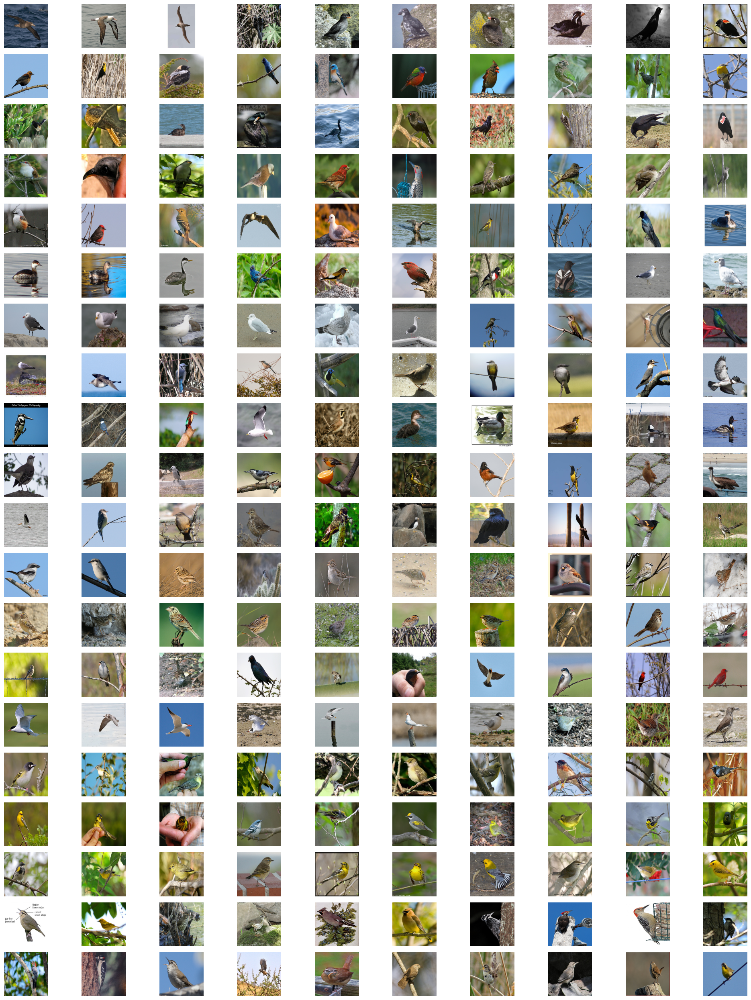

In [5]:

class_names = {v: k for k, v in train_ds.class_indices.items()}
representatives = {class_name: None for class_name in class_names.values()}

for images, labels in train_ds:
    for i in range(images.shape[0]):
        class_index = np.argmax(labels[i])
        class_name = class_names[class_index]
        if representatives[class_name] is None:
            representatives[class_name] = (images[i] * 255).astype("uint8") 
            
    if all(image is not None for image in representatives.values()):
        break

plt.figure(figsize=(20, 25))
for i, (class_name, image) in enumerate(representatives.items()):
    plt.subplot(20, 10, i + 1)
    plt.imshow(image.astype("uint8"))
    plt.axis("off")
plt.tight_layout()
plt.show()

In [6]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
model = keras.Sequential()

model.add(layers.Conv2D(16, (3, 3), activation='relu', input_shape=(img_size[0], img_size[1], 3)))
model.add(tf.keras.layers.Dropout(0.05))
model.add(layers.MaxPooling2D((2, 2)))


model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(tf.keras.layers.Dropout(0.1))
#model.add(layers.Conv2D(64, (3, 3), activation='relu'))
#model.add(layers.MaxPooling2D((2, 2)))
#model.add(tf.keras.layers.Dropout(0.15))

model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(tf.keras.layers.Dropout(0.3))
model.add(layers.Dense(230, activation='relu'))
model.add(tf.keras.layers.Dropout(0.4))
model.add(layers.Dense(200, activation='softmax'))

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
history = model.fit(train_ds, epochs=20, verbose=1, validation_data=validation_ds, callbacks=[early_stopping])

loss, accurracy = model.evaluate(test_ds)
train_loss, train_accurracy = model.evaluate(train_ds)
print(f'Test accuracy: {accurracy:.4f}')
print(f'Training accuracy: {train_accurracy:.4f}')

Num GPUs Available:  1


I0000 00:00:1733492552.119731   10936 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1733492552.146716   10936 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1733492552.146794   10936 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
/home/des/suns/env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1733492552.156809   10936 cuda_executor.c

Epoch 1/20


/home/des/suns/env/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1733492555.781120   11715 service.cc:146] XLA service 0x7f0e7800d0e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733492555.781180   11715 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Laptop GPU, Compute Capability 8.6
2024-12-06 14:42:35.839657: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-06 14:42:36.147132: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
2024-12

  2/100 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - accuracy: 0.0000e+00 - loss: 7.7852  

I0000 00:00:1733492565.277015   11715 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


100/100 ━━━━━━━━━━━━━━━━━━━━ 32s 200ms/step - accuracy: 0.0025 - loss: 6.0636 - val_accuracy: 0.0088 - val_loss: 5.2983
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - accuracy: 0.0052 - loss: 5.2972 - val_accuracy: 0.0063 - val_loss: 5.2775
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 122ms/step - accuracy: 0.0080 - loss: 5.2555 - val_accuracy: 0.0125 - val_loss: 5.1563
Epoch 4/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.0149 - loss: 5.1343 - val_accuracy: 0.0125 - val_loss: 5.0808
Epoch 5/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - accuracy: 0.0183 - loss: 5.0220 - val_accuracy: 0.0162 - val_loss: 4.9142
Epoch 6/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - accuracy: 0.0321 - loss: 4.8027 - val_accuracy: 0.0213 - val_loss: 4.8357
Epoch 7/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 14s 128ms/step - accuracy: 0.0544 - loss: 4.5239 - val_accuracy: 0.0388 - val_loss: 4.7629
Epoch 8/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - accuracy: 0.1140 - loss: 4.0763 - val

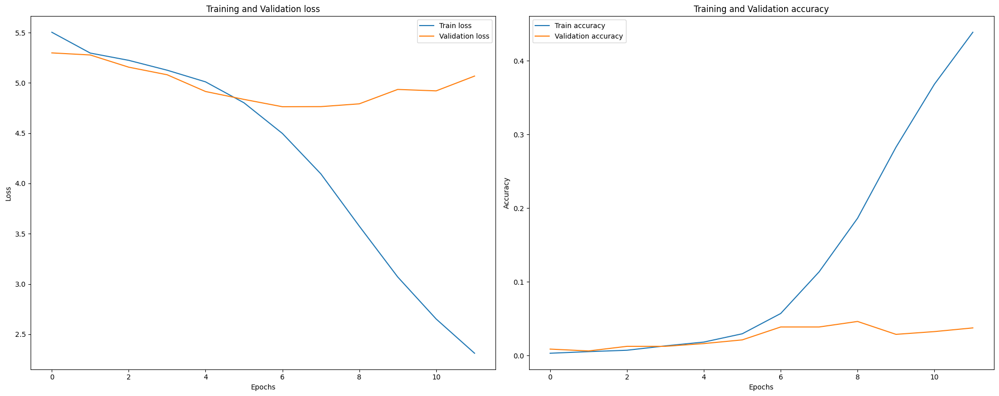

In [7]:
plt.figure(figsize=(20, 8))
plt.subplot(1,2,1)
sns.lineplot(x=range(len(history.history['loss'])), y=history.history['loss'], label="Train loss")
sns.lineplot(x=range(len(history.history['val_loss'])), y=history.history['val_loss'], label="Validation loss")
plt.title("Training and Validation loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.subplot(1,2,2)
sns.lineplot(x=range(len(history.history['accuracy'])), y=history.history['accuracy'], label="Train accuracy")
sns.lineplot(x=range(len(history.history['val_accuracy'])), y=history.history['val_accuracy'], label="Validation accuracy")
plt.title("Training and Validation accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

In [8]:
y_true, y_pred_classes, class_labels = getPredictionsTrain(model, train_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step


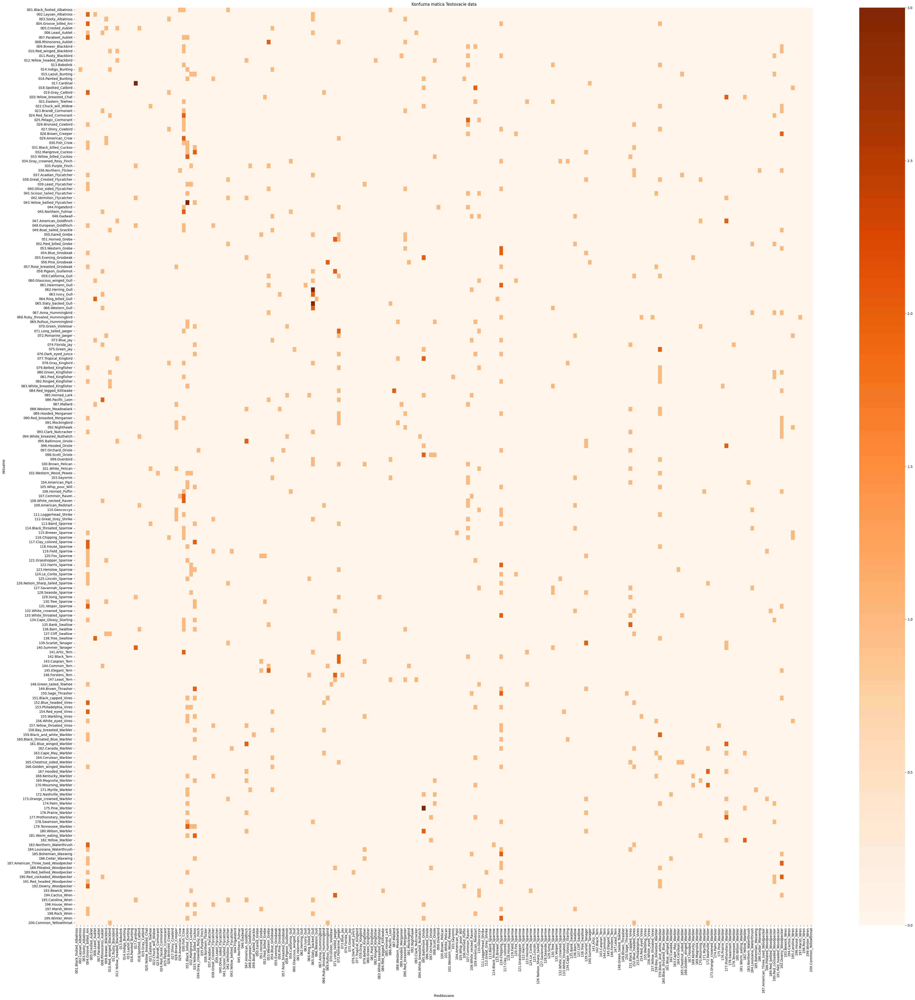

In [9]:
y_pred = np.argmax(model.predict(test_ds), axis=1) 
y_true_test = test_ds.classes
conf_matrix = confusion_matrix(y_true_test, y_pred)

plt.figure(figsize=(50,50))

sns.heatmap(conf_matrix, annot=False, fmt='d', cmap='Oranges', xticklabels=test_ds.class_indices.keys(), yticklabels=test_ds.class_indices.keys())
plt.title("Konfuzna matica Testovacie data")
plt.xlabel("Predikovane")
plt.ylabel("Aktualne")

plt.show()


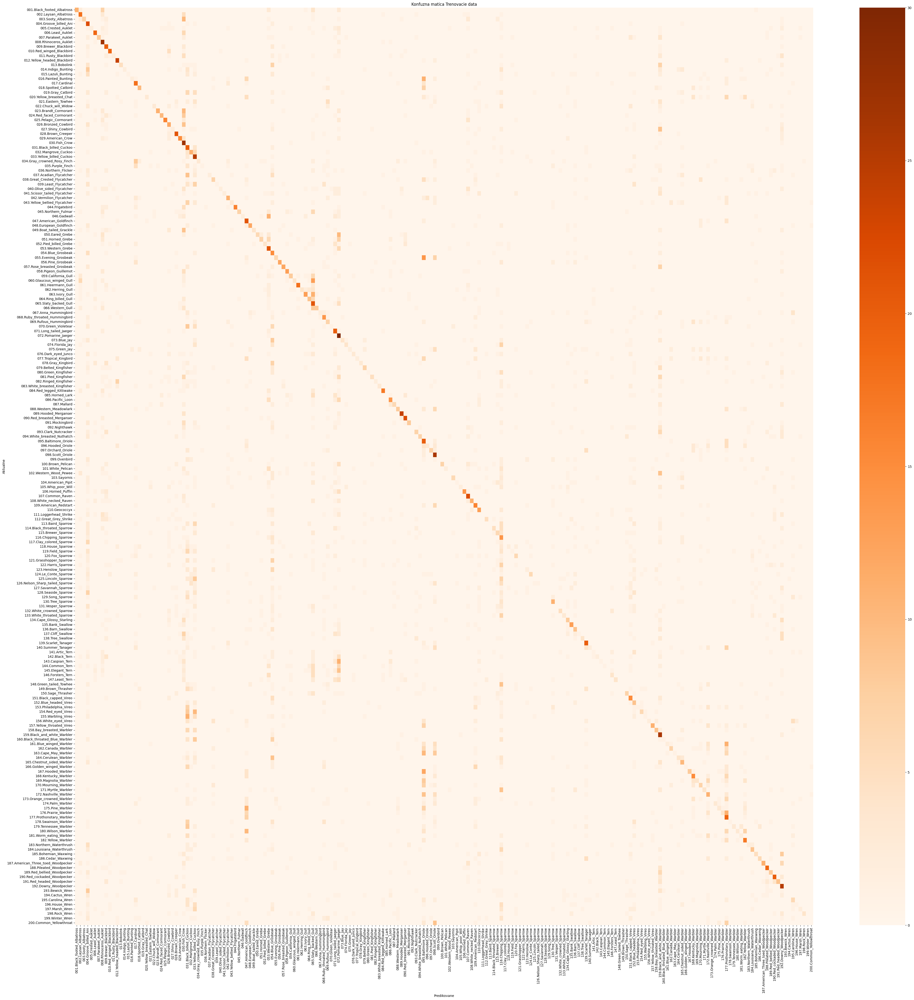

In [10]:
y_true_classes = np.argmax(y_true, axis=1)
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)
#plt.subplot(1,2,2)
plt.figure(figsize=(50,50))
sns.heatmap(conf_matrix, annot=False, fmt='d', cmap='Oranges', xticklabels=class_labels, yticklabels=class_labels)
plt.title("Konfuzna matica Trenovacie data")
plt.xlabel("Predikovane")
plt.ylabel("Aktualne")
plt.show()

In [ ]:
def extractFeaturesToDf(generator, model, dataset_type):
    features = []  
    image_paths = []  
    labels = [] 
    class_names = {v: k for k, v in generator.class_indices.items()}
    
  
    for _ in range(generator.num_batches):
        images, batch_labels = next(generator)
        batch_features = model.predict(images, verbose=1)
        #batch_features = batch_features.reshape(batch_features.shape[0], -1)  # Flatten the features

        features.extend(batch_features)
        image_paths.extend(generator.filepaths[_ * generator.batch_size : (_ + 1) * generator.batch_size])
        labels.extend(np.argmax(batch_labels, axis=1))

    df = pd.DataFrame(features)
    df['image_path'] = image_paths
    df['label'] = labels
    df['class'] = df['label'].map(class_names)
    df['dataset_type'] = dataset_type
    return df

base_model = ResNet50(weights='imagenet', include_top=False, pooling='avg',  input_shape=(img_size[0], img_size[1], 3))
print("train_df processing")
train_df = extractFeaturesToDf(train_ds, base_model)
print("validation_df processing")
validation_df = extractFeaturesToDf(validation_ds, base_model)
print("test_df processing")
test_df = extractFeaturesToDf(test_ds, base_model)

birds_df = pd.concat([train_df, validation_df, test_df], axis=0, ignore_index=True)


train_df processing
2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 51

In [12]:
train_features = pd.read_csv('train_df.csv').iloc[:, :-3].values
test_features = pd.read_csv('test_df.csv').iloc[:, :-3].values
validation_features = pd.read_csv('validation_df.csv').iloc[:, :-3].values

pca = PCA(n_components=5)
train_features_pca = pca.fit_transform(train_features)
test_features_pca = pca.transform(test_features)
validation_features_pca = pca.transform(validation_features)

n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, random_state=69)
clusters = kmeans.fit_predict(train_features_pca)

train_df = pd.read_csv('train_df.csv')
train_df['cluster'] = clusters

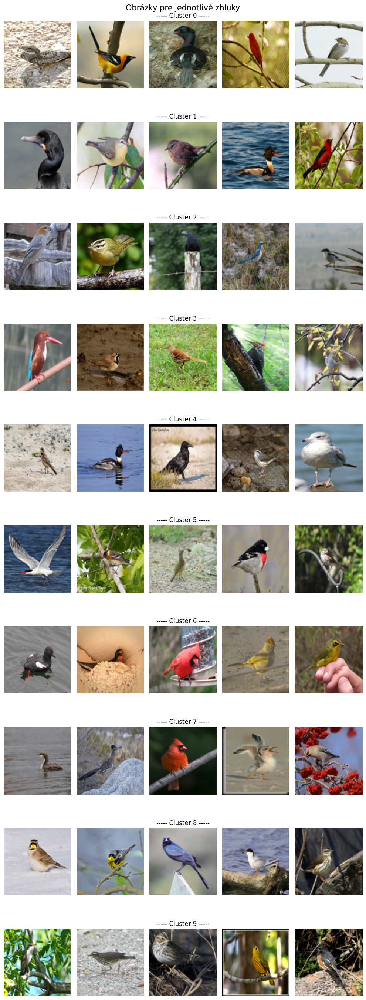

In [13]:
n_images_per_cluster = 5
fig, axes = plt.subplots(n_clusters, n_images_per_cluster, figsize=(10, 28))
fig.suptitle("Obrázky pre jednotlivé zhluky", fontsize=15)

for cluster in range(n_clusters):
    # Náhodný výber obrázkov z aktuálneho zhluku
    cluster_images = train_df[train_df['cluster'] == cluster]['image_path'].values
    if len(cluster_images) > n_images_per_cluster:
        cluster_images = np.random.choice(cluster_images, n_images_per_cluster, replace=False)

    for i, img_path in enumerate(cluster_images):
        img = Image.open(img_path).resize((100, 100))
        axes[cluster, i].imshow(img)
        axes[cluster, i].axis('off')

    # Označenie stredu riadku názvom zhluku
    axes[cluster, n_images_per_cluster // 2].set_title(f"----- Cluster {cluster} -----", fontsize=12, loc='center')

plt.tight_layout()
plt.show()

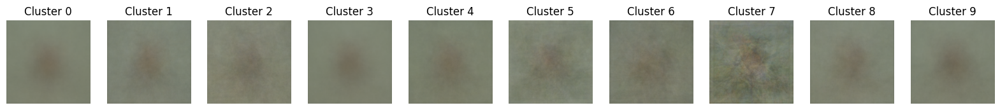

In [14]:
# Funkcia na výpočet priemerného obrázku
def compute_average_image(df, cluster):
    cluster_images = df[df['cluster'] == cluster]['image_path'].values
    imgs = [np.array(Image.open(img_path).resize((224, 224)).convert('RGB')) for img_path in cluster_images]
    avg_img = np.mean(imgs, axis=0).astype(np.uint8)
    return avg_img

# Zobrazenie priemerných obrázkov
fig, axes = plt.subplots(1, n_clusters, figsize=(20, 5))
for cluster in range(n_clusters):
    avg_img = compute_average_image(train_df, cluster)
    axes[cluster].imshow(avg_img)
    axes[cluster].axis('off')
    axes[cluster].set_title(f'Cluster {cluster}')
plt.show()

In [18]:
#DecisionTreeClassifier
model = DecisionTreeClassifier()
model.fit(train_features_pca, train_df['cluster'])

y_pred = model.predict(test_features_pca)
y_pred_train = model.predict(train_features_pca)

accurracy = accuracy_score(test_df['cluster'], y_pred)
print(f"model accuracy: {accurracy}")

KeyError: 'cluster'